In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [3]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [4]:
# Define spectral model - a simple Power Law in this case
model_simu = PowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True


In [5]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [6]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [8]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [9]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [10]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 37268 
    Total predicted counts          : 37203.94
    Total off counts                : 101390.00

    Total background counts         : 20278.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.99

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [11]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 28.6 s, sys: 205 ms, total: 28.8 s
Wall time: 28.8 s


In [12]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 37107 
    Total predicted counts          : 37257.94
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.87

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 36990 
    Total predicted counts          : 37192.34
    Total off counts                : 101332.00

    Total background counts         : 2

SpectrumDatasetOnOff

    Name                            : obs_32 

    Total counts                    : 37413 
    Total predicted counts          : 37275.14
    Total off counts                : 101746.00

    Total background counts         : 20349.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.08

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_33 

    Total counts                    : 37318 
    Total predicted counts          : 37241.34
    Total off counts                : 101577.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_66 

    Total counts                    : 36965 
    Total predicted counts          : 37319.54
    Total off counts                : 101968.00

    Total background counts         : 20393.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.58

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_67 

    Total counts                    : 37143 
    Total predicted counts          : 37271.54
    Total off counts                : 101728.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_102 

    Total counts                    : 37016 
    Total predicted counts          : 37234.14
    Total off counts                : 101541.00

    Total background counts         : 20308.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.14

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_103 

    Total counts                    : 37227 
    Total predicted counts          : 37227.34
    Total off counts                : 101507.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_139 

    Total counts                    : 37036 
    Total predicted counts          : 37227.74
    Total off counts                : 101509.00

    Total background counts         : 20301.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.83

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_140 

    Total counts                    : 37095 
    Total predicted counts          : 37187.94
    Total off counts                : 101310.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_175 

    Total counts                    : 37483 
    Total predicted counts          : 37308.34
    Total off counts                : 101912.00

    Total background counts         : 20382.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_176 

    Total counts                    : 37003 
    Total predicted counts          : 37161.74
    Total off counts                : 101179.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_210 

    Total counts                    : 37275 
    Total predicted counts          : 37152.14
    Total off counts                : 101131.00

    Total background counts         : 20226.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.43

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_211 

    Total counts                    : 37826 
    Total predicted counts          : 37175.74
    Total off counts                : 101249.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_247 

    Total counts                    : 37174 
    Total predicted counts          : 37280.14
    Total off counts                : 101771.00

    Total background counts         : 20354.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.02

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_248 

    Total counts                    : 37218 
    Total predicted counts          : 37227.54
    Total off counts                : 101508.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_285 

    Total counts                    : 37056 
    Total predicted counts          : 37281.94
    Total off counts                : 101780.00

    Total background counts         : 20356.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.43

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_286 

    Total counts                    : 37271 
    Total predicted counts          : 37274.74
    Total off counts                : 101744.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_323 

    Total counts                    : 37341 
    Total predicted counts          : 37192.74
    Total off counts                : 101334.00

    Total background counts         : 20266.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.69

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_324 

    Total counts                    : 37104 
    Total predicted counts          : 37319.94
    Total off counts                : 101970.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_360 

    Total counts                    : 37346 
    Total predicted counts          : 37220.74
    Total off counts                : 101474.00

    Total background counts         : 20294.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.98

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_361 

    Total counts                    : 37420 
    Total predicted counts          : 37122.54
    Total off counts                : 100983.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_397 

    Total counts                    : 37311 
    Total predicted counts          : 37224.74
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.78

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_398 

    Total counts                    : 37425 
    Total predicted counts          : 37337.34
    Total off counts                : 102057.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_433 

    Total counts                    : 37225 
    Total predicted counts          : 37255.14
    Total off counts                : 101646.00

    Total background counts         : 20329.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.06

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_434 

    Total counts                    : 37223 
    Total predicted counts          : 37166.74
    Total off counts                : 101204.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_469 

    Total counts                    : 37161 
    Total predicted counts          : 37231.74
    Total off counts                : 101529.00

    Total background counts         : 20305.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.89

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_470 

    Total counts                    : 37151 
    Total predicted counts          : 37129.34
    Total off counts                : 101017.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_507 

    Total counts                    : 37127 
    Total predicted counts          : 37114.14
    Total off counts                : 100941.00

    Total background counts         : 20188.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.49

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_508 

    Total counts                    : 37186 
    Total predicted counts          : 37196.74
    Total off counts                : 101354.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_542 

    Total counts                    : 37146 
    Total predicted counts          : 37185.94
    Total off counts                : 101300.00

    Total background counts         : 20260.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.86

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_543 

    Total counts                    : 37044 
    Total predicted counts          : 37225.94
    Total off counts                : 101500.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_580 

    Total counts                    : 37234 
    Total predicted counts          : 37322.54
    Total off counts                : 101983.00

    Total background counts         : 20396.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.25

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_581 

    Total counts                    : 36900 
    Total predicted counts          : 37215.94
    Total off counts                : 101450.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_618 

    Total counts                    : 37386 
    Total predicted counts          : 37209.14
    Total off counts                : 101416.00

    Total background counts         : 20283.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.32

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_619 

    Total counts                    : 37377 
    Total predicted counts          : 37271.14
    Total off counts                : 101726.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_654 

    Total counts                    : 37240 
    Total predicted counts          : 37180.54
    Total off counts                : 101273.00

    Total background counts         : 20254.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.31

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_655 

    Total counts                    : 37425 
    Total predicted counts          : 37197.74
    Total off counts                : 101359.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_690 

    Total counts                    : 37179 
    Total predicted counts          : 37280.34
    Total off counts                : 101772.00

    Total background counts         : 20354.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.09

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_691 

    Total counts                    : 37092 
    Total predicted counts          : 37194.74
    Total off counts                : 101344.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_727 

    Total counts                    : 36932 
    Total predicted counts          : 37211.34
    Total off counts                : 101427.00

    Total background counts         : 20285.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.71

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_728 

    Total counts                    : 37316 
    Total predicted counts          : 37225.74
    Total off counts                : 101499.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_762 

    Total counts                    : 37056 
    Total predicted counts          : 37229.14
    Total off counts                : 101516.00

    Total background counts         : 20303.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.19

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_763 

    Total counts                    : 37237 
    Total predicted counts          : 37310.54
    Total off counts                : 101923.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_798 

    Total counts                    : 37357 
    Total predicted counts          : 37309.74
    Total off counts                : 101919.00

    Total background counts         : 20383.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_799 

    Total counts                    : 37613 
    Total predicted counts          : 37169.94
    Total off counts                : 101220.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_835 

    Total counts                    : 37359 
    Total predicted counts          : 37232.54
    Total off counts                : 101533.00

    Total background counts         : 20306.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.09

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_836 

    Total counts                    : 37721 
    Total predicted counts          : 37195.74
    Total off counts                : 101349.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_872 

    Total counts                    : 37117 
    Total predicted counts          : 37230.74
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.59

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_873 

    Total counts                    : 37045 
    Total predicted counts          : 37254.54
    Total off counts                : 101643.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_909 

    Total counts                    : 36977 
    Total predicted counts          : 37210.94
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.92

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_910 

    Total counts                    : 37013 
    Total predicted counts          : 37164.14
    Total off counts                : 101191.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_946 

    Total counts                    : 37467 
    Total predicted counts          : 37343.74
    Total off counts                : 102089.00

    Total background counts         : 20417.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.59

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_947 

    Total counts                    : 37120 
    Total predicted counts          : 37156.54
    Total off counts                : 101153.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_982 

    Total counts                    : 36855 
    Total predicted counts          : 37210.74
    Total off counts                : 101424.00

    Total background counts         : 20284.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_983 

    Total counts                    : 37183 
    Total predicted counts          : 37354.74
    Total off counts                : 102144.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_1018 

    Total counts                    : 37067 
    Total predicted counts          : 37315.94
    Total off counts                : 101950.00

    Total background counts         : 20390.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.32

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1019 

    Total counts                    : 37338 
    Total predicted counts          : 37153.94
    Total off counts                : 101140.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1055 

    Total counts                    : 37016 
    Total predicted counts          : 37274.54
    Total off counts                : 101743.00

    Total background counts         : 20348.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.25

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1056 

    Total counts                    : 37099 
    Total predicted counts          : 37156.54
    Total off counts                : 101153.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1091 

    Total counts                    : 37250 
    Total predicted counts          : 37291.54
    Total off counts                : 101828.00

    Total background counts         : 20365.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.12

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1092 

    Total counts                    : 36987 
    Total predicted counts          : 37310.34
    Total off counts                : 101922.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1127 

    Total counts                    : 37305 
    Total predicted counts          : 37154.34
    Total off counts                : 101142.00

    Total background counts         : 20228.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.52

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1128 

    Total counts                    : 37435 
    Total predicted counts          : 37192.14
    Total off counts                : 101331.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1162 

    Total counts                    : 37364 
    Total predicted counts          : 37286.34
    Total off counts                : 101802.00

    Total background counts         : 20360.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.55

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1163 

    Total counts                    : 37144 
    Total predicted counts          : 37255.14
    Total off counts                : 101646.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1197 

    Total counts                    : 37666 
    Total predicted counts          : 37220.94
    Total off counts                : 101475.00

    Total background counts         : 20295.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.04

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1198 

    Total counts                    : 37331 
    Total predicted counts          : 37186.94
    Total off counts                : 101305.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1233 

    Total counts                    : 37226 
    Total predicted counts          : 37284.34
    Total off counts                : 101792.00

    Total background counts         : 20358.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.57

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1234 

    Total counts                    : 37104 
    Total predicted counts          : 37135.14
    Total off counts                : 101046.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1269 

    Total counts                    : 37027 
    Total predicted counts          : 37293.14
    Total off counts                : 101836.00

    Total background counts         : 20367.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.49

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1270 

    Total counts                    : 37252 
    Total predicted counts          : 37356.34
    Total off counts                : 102152.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1306 

    Total counts                    : 37406 
    Total predicted counts          : 37271.74
    Total off counts                : 101729.00

    Total background counts         : 20345.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.92

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1307 

    Total counts                    : 36889 
    Total predicted counts          : 37347.54
    Total off counts                : 102108.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1343 

    Total counts                    : 37529 
    Total predicted counts          : 37378.14
    Total off counts                : 102261.00

    Total background counts         : 20452.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.25

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1344 

    Total counts                    : 37213 
    Total predicted counts          : 37222.74
    Total off counts                : 101484.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1378 

    Total counts                    : 37144 
    Total predicted counts          : 37213.94
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.82

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1379 

    Total counts                    : 36934 
    Total predicted counts          : 37278.54
    Total off counts                : 101763.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1413 

    Total counts                    : 36963 
    Total predicted counts          : 37254.74
    Total off counts                : 101644.00

    Total background counts         : 20328.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.10

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1414 

    Total counts                    : 37038 
    Total predicted counts          : 37289.54
    Total off counts                : 101818.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1450 

    Total counts                    : 37104 
    Total predicted counts          : 37196.34
    Total off counts                : 101352.00

    Total background counts         : 20270.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.76

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1451 

    Total counts                    : 37442 
    Total predicted counts          : 37159.94
    Total off counts                : 101170.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1482 

    Total counts                    : 37247 
    Total predicted counts          : 37285.34
    Total off counts                : 101797.00

    Total background counts         : 20359.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.94

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1483 

    Total counts                    : 37608 
    Total predicted counts          : 37294.94
    Total off counts                : 101845.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1520 

    Total counts                    : 37235 
    Total predicted counts          : 37310.54
    Total off counts                : 101923.00

    Total background counts         : 20384.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.22

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1521 

    Total counts                    : 37529 
    Total predicted counts          : 37312.14
    Total off counts                : 101931.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1555 

    Total counts                    : 37067 
    Total predicted counts          : 37257.54
    Total off counts                : 101658.00

    Total background counts         : 20331.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.17

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1556 

    Total counts                    : 37274 
    Total predicted counts          : 37168.94
    Total off counts                : 101215.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1590 

    Total counts                    : 37146 
    Total predicted counts          : 37291.94
    Total off counts                : 101830.00

    Total background counts         : 20366.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1591 

    Total counts                    : 37149 
    Total predicted counts          : 37103.54
    Total off counts                : 100888.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1625 

    Total counts                    : 37318 
    Total predicted counts          : 37336.34
    Total off counts                : 102052.00

    Total background counts         : 20410.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.56

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1626 

    Total counts                    : 37170 
    Total predicted counts          : 37166.74
    Total off counts                : 101204.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1659 

    Total counts                    : 36988 
    Total predicted counts          : 37246.54
    Total off counts                : 101603.00

    Total background counts         : 20320.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.18

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1660 

    Total counts                    : 37277 
    Total predicted counts          : 37097.54
    Total off counts                : 100858.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1693 

    Total counts                    : 37256 
    Total predicted counts          : 37212.74
    Total off counts                : 101434.00

    Total background counts         : 20286.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.91

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1694 

    Total counts                    : 37299 
    Total predicted counts          : 37189.54
    Total off counts                : 101318.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1727 

    Total counts                    : 37094 
    Total predicted counts          : 37194.14
    Total off counts                : 101341.00

    Total background counts         : 20268.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1728 

    Total counts                    : 37171 
    Total predicted counts          : 37188.54
    Total off counts                : 101313.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1759 

    Total counts                    : 37000 
    Total predicted counts          : 37241.54
    Total off counts                : 101578.00

    Total background counts         : 20315.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.64

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1760 

    Total counts                    : 37266 
    Total predicted counts          : 37223.54
    Total off counts                : 101488.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1795 

    Total counts                    : 37207 
    Total predicted counts          : 37175.54
    Total off counts                : 101248.00

    Total background counts         : 20249.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.50

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1796 

    Total counts                    : 37260 
    Total predicted counts          : 37362.94
    Total off counts                : 102185.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1829 

    Total counts                    : 36987 
    Total predicted counts          : 37268.34
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.26

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1830 

    Total counts                    : 37285 
    Total predicted counts          : 37171.34
    Total off counts                : 101227.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1865 

    Total counts                    : 37126 
    Total predicted counts          : 37264.54
    Total off counts                : 101693.00

    Total background counts         : 20338.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.30

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1866 

    Total counts                    : 37004 
    Total predicted counts          : 37222.54
    Total off counts                : 101483.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1903 

    Total counts                    : 37211 
    Total predicted counts          : 37225.74
    Total off counts                : 101499.00

    Total background counts         : 20299.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.14

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1904 

    Total counts                    : 37465 
    Total predicted counts          : 37147.74
    Total off counts                : 101109.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1940 

    Total counts                    : 37180 
    Total predicted counts          : 37209.94
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.03

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1941 

    Total counts                    : 37217 
    Total predicted counts          : 37146.54
    Total off counts                : 101103.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1976 

    Total counts                    : 37412 
    Total predicted counts          : 37283.14
    Total off counts                : 101786.00

    Total background counts         : 20357.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.59

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1977 

    Total counts                    : 37357 
    Total predicted counts          : 37270.14
    Total off counts                : 101721.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2014 

    Total counts                    : 37294 
    Total predicted counts          : 37189.94
    Total off counts                : 101320.00

    Total background counts         : 20264.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.79

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2015 

    Total counts                    : 37518 
    Total predicted counts          : 37226.14
    Total off counts                : 101501.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2050 

    Total counts                    : 37177 
    Total predicted counts          : 37200.74
    Total off counts                : 101374.00

    Total background counts         : 20274.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.67

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2051 

    Total counts                    : 37384 
    Total predicted counts          : 37185.74
    Total off counts                : 101299.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2087 

    Total counts                    : 37053 
    Total predicted counts          : 37254.74
    Total off counts                : 101644.00

    Total background counts         : 20328.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.68

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2088 

    Total counts                    : 37393 
    Total predicted counts          : 37279.34
    Total off counts                : 101767.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2124 

    Total counts                    : 37535 
    Total predicted counts          : 37216.74
    Total off counts                : 101454.00

    Total background counts         : 20290.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.31

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2125 

    Total counts                    : 37279 
    Total predicted counts          : 37342.54
    Total off counts                : 102083.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2161 

    Total counts                    : 37537 
    Total predicted counts          : 37229.54
    Total off counts                : 101518.00

    Total background counts         : 20303.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.30

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2162 

    Total counts                    : 37226 
    Total predicted counts          : 37353.94
    Total off counts                : 102140.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2198 

    Total counts                    : 37253 
    Total predicted counts          : 37276.54
    Total off counts                : 101753.00

    Total background counts         : 20350.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.15

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2199 

    Total counts                    : 37230 
    Total predicted counts          : 37184.14
    Total off counts                : 101291.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2235 

    Total counts                    : 37227 
    Total predicted counts          : 37203.14
    Total off counts                : 101386.00

    Total background counts         : 20277.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.87

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2236 

    Total counts                    : 37426 
    Total predicted counts          : 37253.74
    Total off counts                : 101639.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2272 

    Total counts                    : 36891 
    Total predicted counts          : 37314.94
    Total off counts                : 101945.00

    Total background counts         : 20389.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.28

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2273 

    Total counts                    : 37153 
    Total predicted counts          : 37270.74
    Total off counts                : 101724.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2309 

    Total counts                    : 36971 
    Total predicted counts          : 37149.94
    Total off counts                : 101120.00

    Total background counts         : 20224.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.19

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2310 

    Total counts                    : 37176 
    Total predicted counts          : 37358.94
    Total off counts                : 102165.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2345 

    Total counts                    : 37605 
    Total predicted counts          : 37350.74
    Total off counts                : 102124.00

    Total background counts         : 20424.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.06

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2346 

    Total counts                    : 37016 
    Total predicted counts          : 37167.94
    Total off counts                : 101210.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2381 

    Total counts                    : 37612 
    Total predicted counts          : 37260.14
    Total off counts                : 101671.00

    Total background counts         : 20334.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.86

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2382 

    Total counts                    : 37206 
    Total predicted counts          : 37285.94
    Total off counts                : 101800.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2419 

    Total counts                    : 37416 
    Total predicted counts          : 37272.14
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.80

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2420 

    Total counts                    : 37454 
    Total predicted counts          : 37141.34
    Total off counts                : 101077.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2454 

    Total counts                    : 37025 
    Total predicted counts          : 37226.94
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.99

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2455 

    Total counts                    : 37635 
    Total predicted counts          : 37128.54
    Total off counts                : 101013.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2490 

    Total counts                    : 37132 
    Total predicted counts          : 37260.14
    Total off counts                : 101671.00

    Total background counts         : 20334.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.36

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2491 

    Total counts                    : 37376 
    Total predicted counts          : 37279.54
    Total off counts                : 101768.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2526 

    Total counts                    : 37214 
    Total predicted counts          : 37186.74
    Total off counts                : 101304.00

    Total background counts         : 20260.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.93

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2527 

    Total counts                    : 37395 
    Total predicted counts          : 37165.54
    Total off counts                : 101198.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2564 

    Total counts                    : 37376 
    Total predicted counts          : 37224.74
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2565 

    Total counts                    : 37284 
    Total predicted counts          : 37241.54
    Total off counts                : 101578.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2600 

    Total counts                    : 37084 
    Total predicted counts          : 37154.74
    Total off counts                : 101144.00

    Total background counts         : 20228.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.67

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2601 

    Total counts                    : 37345 
    Total predicted counts          : 37219.94
    Total off counts                : 101470.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2637 

    Total counts                    : 36937 
    Total predicted counts          : 37262.54
    Total off counts                : 101683.00

    Total background counts         : 20336.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.27

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2638 

    Total counts                    : 37598 
    Total predicted counts          : 37257.74
    Total off counts                : 101659.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2674 

    Total counts                    : 37328 
    Total predicted counts          : 37213.94
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.61

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2675 

    Total counts                    : 37185 
    Total predicted counts          : 37163.94
    Total off counts                : 101190.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2710 

    Total counts                    : 36960 
    Total predicted counts          : 37285.34
    Total off counts                : 101797.00

    Total background counts         : 20359.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.93

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2711 

    Total counts                    : 37334 
    Total predicted counts          : 37242.14
    Total off counts                : 101581.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2748 

    Total counts                    : 37404 
    Total predicted counts          : 37172.34
    Total off counts                : 101232.00

    Total background counts         : 20246.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.11

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2749 

    Total counts                    : 37346 
    Total predicted counts          : 37214.94
    Total off counts                : 101445.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2783 

    Total counts                    : 37385 
    Total predicted counts          : 37287.54
    Total off counts                : 101808.00

    Total background counts         : 20361.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2784 

    Total counts                    : 37126 
    Total predicted counts          : 37169.74
    Total off counts                : 101219.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2820 

    Total counts                    : 37149 
    Total predicted counts          : 37211.54
    Total off counts                : 101428.00

    Total background counts         : 20285.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.26

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2821 

    Total counts                    : 37336 
    Total predicted counts          : 37169.14
    Total off counts                : 101216.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2857 

    Total counts                    : 36959 
    Total predicted counts          : 37184.14
    Total off counts                : 101291.00

    Total background counts         : 20258.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.40

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2858 

    Total counts                    : 37107 
    Total predicted counts          : 37162.94
    Total off counts                : 101185.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2895 

    Total counts                    : 37086 
    Total predicted counts          : 37234.74
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2896 

    Total counts                    : 37366 
    Total predicted counts          : 37205.54
    Total off counts                : 101398.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2931 

    Total counts                    : 37214 
    Total predicted counts          : 37221.14
    Total off counts                : 101476.00

    Total background counts         : 20295.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.26

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2932 

    Total counts                    : 37346 
    Total predicted counts          : 37253.14
    Total off counts                : 101636.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2967 

    Total counts                    : 37008 
    Total predicted counts          : 37232.34
    Total off counts                : 101532.00

    Total background counts         : 20306.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.58

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2968 

    Total counts                    : 37069 
    Total predicted counts          : 37254.74
    Total off counts                : 101644.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3003 

    Total counts                    : 37089 
    Total predicted counts          : 37156.94
    Total off counts                : 101155.00

    Total background counts         : 20231.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.25

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3004 

    Total counts                    : 37067 
    Total predicted counts          : 37254.74
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3039 

    Total counts                    : 37032 
    Total predicted counts          : 37160.34
    Total off counts                : 101172.00

    Total background counts         : 20234.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.96

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3040 

    Total counts                    : 37417 
    Total predicted counts          : 37122.34
    Total off counts                : 100982.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3075 

    Total counts                    : 36958 
    Total predicted counts          : 37288.94
    Total off counts                : 101815.00

    Total background counts         : 20363.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.19

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3076 

    Total counts                    : 37324 
    Total predicted counts          : 37245.94
    Total off counts                : 101600.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3111 

    Total counts                    : 37138 
    Total predicted counts          : 37216.34
    Total off counts                : 101452.00

    Total background counts         : 20290.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.41

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3112 

    Total counts                    : 37255 
    Total predicted counts          : 37258.74
    Total off counts                : 101664.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3148 

    Total counts                    : 37404 
    Total predicted counts          : 37353.54
    Total off counts                : 102138.00

    Total background counts         : 20427.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.46

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3149 

    Total counts                    : 37419 
    Total predicted counts          : 37171.34
    Total off counts                : 101227.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3184 

    Total counts                    : 37211 
    Total predicted counts          : 37197.94
    Total off counts                : 101360.00

    Total background counts         : 20272.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.94

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3185 

    Total counts                    : 37294 
    Total predicted counts          : 37289.14
    Total off counts                : 101816.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3221 

    Total counts                    : 37646 
    Total predicted counts          : 37292.14
    Total off counts                : 101831.00

    Total background counts         : 20366.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.42

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3222 

    Total counts                    : 37390 
    Total predicted counts          : 37189.74
    Total off counts                : 101319.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3257 

    Total counts                    : 37109 
    Total predicted counts          : 37260.94
    Total off counts                : 101675.00

    Total background counts         : 20335.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.48

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3258 

    Total counts                    : 36949 
    Total predicted counts          : 37210.94
    Total off counts                : 101425.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3295 

    Total counts                    : 37230 
    Total predicted counts          : 37304.14
    Total off counts                : 101891.00

    Total background counts         : 20378.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.34

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3296 

    Total counts                    : 37361 
    Total predicted counts          : 37213.14
    Total off counts                : 101436.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3332 

    Total counts                    : 37032 
    Total predicted counts          : 37304.94
    Total off counts                : 101895.00

    Total background counts         : 20379.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.13

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3333 

    Total counts                    : 37334 
    Total predicted counts          : 37153.94
    Total off counts                : 101140.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3368 

    Total counts                    : 37061 
    Total predicted counts          : 37188.94
    Total off counts                : 101315.00

    Total background counts         : 20263.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.06

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3369 

    Total counts                    : 37205 
    Total predicted counts          : 37340.14
    Total off counts                : 102071.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3404 

    Total counts                    : 37379 
    Total predicted counts          : 37249.54
    Total off counts                : 101618.00

    Total background counts         : 20323.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.11

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3405 

    Total counts                    : 37399 
    Total predicted counts          : 37243.74
    Total off counts                : 101589.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3440 

    Total counts                    : 37365 
    Total predicted counts          : 37310.94
    Total off counts                : 101925.00

    Total background counts         : 20385.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.64

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3441 

    Total counts                    : 37394 
    Total predicted counts          : 37132.14
    Total off counts                : 101031.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3478 

    Total counts                    : 37128 
    Total predicted counts          : 37294.14
    Total off counts                : 101841.00

    Total background counts         : 20368.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3479 

    Total counts                    : 37442 
    Total predicted counts          : 37298.74
    Total off counts                : 101864.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3515 

    Total counts                    : 36977 
    Total predicted counts          : 37272.54
    Total off counts                : 101733.00

    Total background counts         : 20346.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.61

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3516 

    Total counts                    : 37350 
    Total predicted counts          : 37181.34
    Total off counts                : 101277.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3551 

    Total counts                    : 37569 
    Total predicted counts          : 37318.94
    Total off counts                : 101965.00

    Total background counts         : 20393.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.06

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3552 

    Total counts                    : 37162 
    Total predicted counts          : 37224.74
    Total off counts                : 101494.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3590 

    Total counts                    : 36968 
    Total predicted counts          : 37218.94
    Total off counts                : 101465.00

    Total background counts         : 20293.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.51

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3591 

    Total counts                    : 37011 
    Total predicted counts          : 37273.14
    Total off counts                : 101736.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3625 

    Total counts                    : 37307 
    Total predicted counts          : 37206.14
    Total off counts                : 101401.00

    Total background counts         : 20280.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.21

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3626 

    Total counts                    : 37365 
    Total predicted counts          : 37305.54
    Total off counts                : 101898.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3661 

    Total counts                    : 37101 
    Total predicted counts          : 37256.54
    Total off counts                : 101653.00

    Total background counts         : 20330.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3662 

    Total counts                    : 36923 
    Total predicted counts          : 37252.74
    Total off counts                : 101634.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3698 

    Total counts                    : 37315 
    Total predicted counts          : 37204.94
    Total off counts                : 101395.00

    Total background counts         : 20279.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.65

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3699 

    Total counts                    : 37147 
    Total predicted counts          : 37175.94
    Total off counts                : 101250.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3733 

    Total counts                    : 37620 
    Total predicted counts          : 37198.34
    Total off counts                : 101362.00

    Total background counts         : 20272.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.80

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3734 

    Total counts                    : 37060 
    Total predicted counts          : 37276.74
    Total off counts                : 101754.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3771 

    Total counts                    : 37086 
    Total predicted counts          : 37245.34
    Total off counts                : 101597.00

    Total background counts         : 20319.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.57

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3772 

    Total counts                    : 37520 
    Total predicted counts          : 37173.74
    Total off counts                : 101239.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3809 

    Total counts                    : 37217 
    Total predicted counts          : 37222.14
    Total off counts                : 101481.00

    Total background counts         : 20296.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.12

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3810 

    Total counts                    : 37345 
    Total predicted counts          : 37163.74
    Total off counts                : 101189.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3846 

    Total counts                    : 37177 
    Total predicted counts          : 37174.34
    Total off counts                : 101242.00

    Total background counts         : 20248.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.60

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3847 

    Total counts                    : 37110 
    Total predicted counts          : 37238.54
    Total off counts                : 101563.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3882 

    Total counts                    : 37377 
    Total predicted counts          : 37337.34
    Total off counts                : 102057.00

    Total background counts         : 20411.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.79

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3883 

    Total counts                    : 37199 
    Total predicted counts          : 37198.34
    Total off counts                : 101362.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3921 

    Total counts                    : 36853 
    Total predicted counts          : 37150.14
    Total off counts                : 101121.00

    Total background counts         : 20224.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.01

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3922 

    Total counts                    : 37264 
    Total predicted counts          : 37199.74
    Total off counts                : 101369.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3958 

    Total counts                    : 37095 
    Total predicted counts          : 37202.14
    Total off counts                : 101381.00

    Total background counts         : 20276.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.51

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3959 

    Total counts                    : 37083 
    Total predicted counts          : 37159.54
    Total off counts                : 101168.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3993 

    Total counts                    : 37172 
    Total predicted counts          : 37200.74
    Total off counts                : 101374.00

    Total background counts         : 20274.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3994 

    Total counts                    : 37017 
    Total predicted counts          : 37273.34
    Total off counts                : 101737.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4030 

    Total counts                    : 37189 
    Total predicted counts          : 37233.54
    Total off counts                : 101538.00

    Total background counts         : 20307.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.58

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4031 

    Total counts                    : 37336 
    Total predicted counts          : 37268.14
    Total off counts                : 101711.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4067 

    Total counts                    : 37523 
    Total predicted counts          : 37257.94
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.76

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4068 

    Total counts                    : 37378 
    Total predicted counts          : 37238.14
    Total off counts                : 101561.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4103 

    Total counts                    : 37189 
    Total predicted counts          : 37212.74
    Total off counts                : 101434.00

    Total background counts         : 20286.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.03

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4104 

    Total counts                    : 37571 
    Total predicted counts          : 37161.34
    Total off counts                : 101177.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4140 

    Total counts                    : 37379 
    Total predicted counts          : 37230.54
    Total off counts                : 101523.00

    Total background counts         : 20304.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.44

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4141 

    Total counts                    : 37196 
    Total predicted counts          : 37236.54
    Total off counts                : 101553.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4176 

    Total counts                    : 37316 
    Total predicted counts          : 37340.94
    Total off counts                : 102075.00

    Total background counts         : 20415.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.16

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4177 

    Total counts                    : 37119 
    Total predicted counts          : 37207.54
    Total off counts                : 101408.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4213 

    Total counts                    : 37245 
    Total predicted counts          : 37290.14
    Total off counts                : 101821.00

    Total background counts         : 20364.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.09

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4214 

    Total counts                    : 37447 
    Total predicted counts          : 37146.14
    Total off counts                : 101101.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4251 

    Total counts                    : 37234 
    Total predicted counts          : 37223.34
    Total off counts                : 101487.00

    Total background counts         : 20297.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.10

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4252 

    Total counts                    : 37330 
    Total predicted counts          : 37197.54
    Total off counts                : 101358.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4288 

    Total counts                    : 37340 
    Total predicted counts          : 37280.14
    Total off counts                : 101771.00

    Total background counts         : 20354.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.23

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4289 

    Total counts                    : 37263 
    Total predicted counts          : 37261.34
    Total off counts                : 101677.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4323 

    Total counts                    : 37238 
    Total predicted counts          : 37094.54
    Total off counts                : 100843.00

    Total background counts         : 20168.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.51

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4324 

    Total counts                    : 37397 
    Total predicted counts          : 37218.94
    Total off counts                : 101465.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4360 

    Total counts                    : 37263 
    Total predicted counts          : 37232.74
    Total off counts                : 101534.00

    Total background counts         : 20306.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.66

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4361 

    Total counts                    : 37142 
    Total predicted counts          : 37266.94
    Total off counts                : 101705.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4396 

    Total counts                    : 37185 
    Total predicted counts          : 37226.54
    Total off counts                : 101503.00

    Total background counts         : 20300.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.38

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4397 

    Total counts                    : 37040 
    Total predicted counts          : 37221.74
    Total off counts                : 101479.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4434 

    Total counts                    : 37364 
    Total predicted counts          : 37192.34
    Total off counts                : 101332.00

    Total background counts         : 20266.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.11

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4435 

    Total counts                    : 37211 
    Total predicted counts          : 37277.34
    Total off counts                : 101757.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4470 

    Total counts                    : 37039 
    Total predicted counts          : 37304.14
    Total off counts                : 101891.00

    Total background counts         : 20378.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.61

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4471 

    Total counts                    : 37261 
    Total predicted counts          : 37315.94
    Total off counts                : 101950.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4507 

    Total counts                    : 37363 
    Total predicted counts          : 37285.14
    Total off counts                : 101796.00

    Total background counts         : 20359.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.16

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4508 

    Total counts                    : 37252 
    Total predicted counts          : 37217.34
    Total off counts                : 101457.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4544 

    Total counts                    : 36947 
    Total predicted counts          : 37188.94
    Total off counts                : 101315.00

    Total background counts         : 20263.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4545 

    Total counts                    : 36921 
    Total predicted counts          : 37210.54
    Total off counts                : 101423.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4581 

    Total counts                    : 37440 
    Total predicted counts          : 37289.34
    Total off counts                : 101817.00

    Total background counts         : 20363.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.40

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4582 

    Total counts                    : 37248 
    Total predicted counts          : 37141.74
    Total off counts                : 101079.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4617 

    Total counts                    : 37577 
    Total predicted counts          : 37239.94
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.89

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4618 

    Total counts                    : 37257 
    Total predicted counts          : 37262.14
    Total off counts                : 101681.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4654 

    Total counts                    : 37428 
    Total predicted counts          : 37254.14
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.50

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4655 

    Total counts                    : 37311 
    Total predicted counts          : 37219.14
    Total off counts                : 101466.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4691 

    Total counts                    : 37145 
    Total predicted counts          : 37213.34
    Total off counts                : 101437.00

    Total background counts         : 20287.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.85

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4692 

    Total counts                    : 37288 
    Total predicted counts          : 37311.14
    Total off counts                : 101926.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4728 

    Total counts                    : 37273 
    Total predicted counts          : 37231.14
    Total off counts                : 101526.00

    Total background counts         : 20305.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.81

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4729 

    Total counts                    : 37078 
    Total predicted counts          : 37322.94
    Total off counts                : 101985.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4766 

    Total counts                    : 37396 
    Total predicted counts          : 37369.54
    Total off counts                : 102218.00

    Total background counts         : 20443.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.95

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4767 

    Total counts                    : 37154 
    Total predicted counts          : 37059.14
    Total off counts                : 100666.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4803 

    Total counts                    : 37322 
    Total predicted counts          : 37223.74
    Total off counts                : 101489.00

    Total background counts         : 20297.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.83

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4804 

    Total counts                    : 37231 
    Total predicted counts          : 37051.34
    Total off counts                : 100627.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4841 

    Total counts                    : 36930 
    Total predicted counts          : 37128.94
    Total off counts                : 101015.00

    Total background counts         : 20203.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.19

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4842 

    Total counts                    : 37136 
    Total predicted counts          : 37211.34
    Total off counts                : 101427.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4878 

    Total counts                    : 37341 
    Total predicted counts          : 37212.74
    Total off counts                : 101434.00

    Total background counts         : 20286.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.97

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4879 

    Total counts                    : 37294 
    Total predicted counts          : 37284.14
    Total off counts                : 101791.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4914 

    Total counts                    : 37219 
    Total predicted counts          : 37222.74
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.02

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4915 

    Total counts                    : 37374 
    Total predicted counts          : 37251.14
    Total off counts                : 101626.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4950 

    Total counts                    : 37279 
    Total predicted counts          : 37313.74
    Total off counts                : 101939.00

    Total background counts         : 20387.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.38

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4951 

    Total counts                    : 37665 
    Total predicted counts          : 37261.54
    Total off counts                : 101678.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4988 

    Total counts                    : 37417 
    Total predicted counts          : 37261.14
    Total off counts                : 101676.00

    Total background counts         : 20335.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4989 

    Total counts                    : 37206 
    Total predicted counts          : 37237.94
    Total off counts                : 101560.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5026 

    Total counts                    : 36939 
    Total predicted counts          : 37262.54
    Total off counts                : 101683.00

    Total background counts         : 20336.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.11

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5027 

    Total counts                    : 37087 
    Total predicted counts          : 37190.74
    Total off counts                : 101324.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5063 

    Total counts                    : 37383 
    Total predicted counts          : 37213.14
    Total off counts                : 101436.00

    Total background counts         : 20287.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5064 

    Total counts                    : 37157 
    Total predicted counts          : 37330.14
    Total off counts                : 102021.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5098 

    Total counts                    : 37491 
    Total predicted counts          : 37285.34
    Total off counts                : 101797.00

    Total background counts         : 20359.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.35

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5099 

    Total counts                    : 37221 
    Total predicted counts          : 37058.94
    Total off counts                : 100665.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5137 

    Total counts                    : 37384 
    Total predicted counts          : 37255.14
    Total off counts                : 101646.00

    Total background counts         : 20329.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.78

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5138 

    Total counts                    : 37075 
    Total predicted counts          : 37197.34
    Total off counts                : 101357.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5174 

    Total counts                    : 37357 
    Total predicted counts          : 37253.74
    Total off counts                : 101639.00

    Total background counts         : 20327.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.81

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5175 

    Total counts                    : 37665 
    Total predicted counts          : 37299.94
    Total off counts                : 101870.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5210 

    Total counts                    : 37126 
    Total predicted counts          : 37183.74
    Total off counts                : 101289.00

    Total background counts         : 20257.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.72

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5211 

    Total counts                    : 37415 
    Total predicted counts          : 37259.54
    Total off counts                : 101668.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5247 

    Total counts                    : 37470 
    Total predicted counts          : 37235.94
    Total off counts                : 101550.00

    Total background counts         : 20310.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.05

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5248 

    Total counts                    : 37084 
    Total predicted counts          : 37220.14
    Total off counts                : 101471.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5285 

    Total counts                    : 37064 
    Total predicted counts          : 37168.94
    Total off counts                : 101215.00

    Total background counts         : 20243.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.82

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5286 

    Total counts                    : 36925 
    Total predicted counts          : 37271.74
    Total off counts                : 101729.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5323 

    Total counts                    : 37068 
    Total predicted counts          : 37287.94
    Total off counts                : 101810.00

    Total background counts         : 20362.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.64

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5324 

    Total counts                    : 37183 
    Total predicted counts          : 37208.74
    Total off counts                : 101414.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5360 

    Total counts                    : 37136 
    Total predicted counts          : 37225.94
    Total off counts                : 101500.00

    Total background counts         : 20300.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.62

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5361 

    Total counts                    : 37405 
    Total predicted counts          : 37122.74
    Total off counts                : 100984.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5394 

    Total counts                    : 37396 
    Total predicted counts          : 37195.94
    Total off counts                : 101350.00

    Total background counts         : 20270.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.21

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5395 

    Total counts                    : 37379 
    Total predicted counts          : 37098.34
    Total off counts                : 100862.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5430 

    Total counts                    : 37226 
    Total predicted counts          : 37257.54
    Total off counts                : 101658.00

    Total background counts         : 20331.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.78

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5431 

    Total counts                    : 37204 
    Total predicted counts          : 37173.54
    Total off counts                : 101238.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5467 

    Total counts                    : 37387 
    Total predicted counts          : 37195.14
    Total off counts                : 101346.00

    Total background counts         : 20269.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.46

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5468 

    Total counts                    : 37412 
    Total predicted counts          : 37198.94
    Total off counts                : 101365.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5504 

    Total counts                    : 37396 
    Total predicted counts          : 37375.34
    Total off counts                : 102247.00

    Total background counts         : 20449.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.91

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5505 

    Total counts                    : 36952 
    Total predicted counts          : 37218.94
    Total off counts                : 101465.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5542 

    Total counts                    : 37383 
    Total predicted counts          : 37200.94
    Total off counts                : 101375.00

    Total background counts         : 20275.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.38

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5543 

    Total counts                    : 37555 
    Total predicted counts          : 37266.54
    Total off counts                : 101703.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5580 

    Total counts                    : 37156 
    Total predicted counts          : 37268.14
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.50

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5581 

    Total counts                    : 37154 
    Total predicted counts          : 37307.34
    Total off counts                : 101907.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5617 

    Total counts                    : 37298 
    Total predicted counts          : 37262.94
    Total off counts                : 101685.00

    Total background counts         : 20337.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5618 

    Total counts                    : 37508 
    Total predicted counts          : 37266.54
    Total off counts                : 101703.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5655 

    Total counts                    : 37279 
    Total predicted counts          : 37213.74
    Total off counts                : 101439.00

    Total background counts         : 20287.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.86

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5656 

    Total counts                    : 37140 
    Total predicted counts          : 37313.54
    Total off counts                : 101938.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5692 

    Total counts                    : 36976 
    Total predicted counts          : 37190.54
    Total off counts                : 101323.00

    Total background counts         : 20264.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.95

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5693 

    Total counts                    : 37535 
    Total predicted counts          : 37179.54
    Total off counts                : 101268.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5729 

    Total counts                    : 36967 
    Total predicted counts          : 37225.34
    Total off counts                : 101497.00

    Total background counts         : 20299.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.03

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5730 

    Total counts                    : 37043 
    Total predicted counts          : 37214.94
    Total off counts                : 101445.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5765 

    Total counts                    : 37339 
    Total predicted counts          : 37321.94
    Total off counts                : 101980.00

    Total background counts         : 20396.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.67

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5766 

    Total counts                    : 37305 
    Total predicted counts          : 37167.14
    Total off counts                : 101206.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5801 

    Total counts                    : 37489 
    Total predicted counts          : 37156.14
    Total off counts                : 101151.00

    Total background counts         : 20230.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.27

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5802 

    Total counts                    : 37052 
    Total predicted counts          : 37178.74
    Total off counts                : 101264.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5837 

    Total counts                    : 36883 
    Total predicted counts          : 37159.74
    Total off counts                : 101169.00

    Total background counts         : 20233.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.27

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5838 

    Total counts                    : 37132 
    Total predicted counts          : 37198.54
    Total off counts                : 101363.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5874 

    Total counts                    : 37066 
    Total predicted counts          : 37288.14
    Total off counts                : 101811.00

    Total background counts         : 20362.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.38

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5875 

    Total counts                    : 37330 
    Total predicted counts          : 37246.54
    Total off counts                : 101603.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5911 

    Total counts                    : 37605 
    Total predicted counts          : 37287.74
    Total off counts                : 101809.00

    Total background counts         : 20361.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.76

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5912 

    Total counts                    : 37468 
    Total predicted counts          : 37254.74
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5948 

    Total counts                    : 37081 
    Total predicted counts          : 37314.34
    Total off counts                : 101942.00

    Total background counts         : 20388.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.66

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5949 

    Total counts                    : 37191 
    Total predicted counts          : 37231.74
    Total off counts                : 101529.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5985 

    Total counts                    : 36833 
    Total predicted counts          : 37203.34
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.21

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5986 

    Total counts                    : 37350 
    Total predicted counts          : 37276.34
    Total off counts                : 101752.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6022 

    Total counts                    : 37265 
    Total predicted counts          : 37245.94
    Total off counts                : 101600.00

    Total background counts         : 20320.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.57

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6023 

    Total counts                    : 36954 
    Total predicted counts          : 37315.74
    Total off counts                : 101949.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6059 

    Total counts                    : 37296 
    Total predicted counts          : 37132.54
    Total off counts                : 101033.00

    Total background counts         : 20206.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.07

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6060 

    Total counts                    : 37089 
    Total predicted counts          : 37285.34
    Total off counts                : 101797.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6097 

    Total counts                    : 37463 
    Total predicted counts          : 37227.74
    Total off counts                : 101509.00

    Total background counts         : 20301.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.64

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6098 

    Total counts                    : 37115 
    Total predicted counts          : 37245.34
    Total off counts                : 101597.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6132 

    Total counts                    : 37335 
    Total predicted counts          : 37230.34
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.29

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6133 

    Total counts                    : 37162 
    Total predicted counts          : 37234.14
    Total off counts                : 101541.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6169 

    Total counts                    : 37132 
    Total predicted counts          : 37273.94
    Total off counts                : 101740.00

    Total background counts         : 20348.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.59

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6170 

    Total counts                    : 36922 
    Total predicted counts          : 37268.94
    Total off counts                : 101715.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6206 

    Total counts                    : 37489 
    Total predicted counts          : 37134.94
    Total off counts                : 101045.00

    Total background counts         : 20209.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.66

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6207 

    Total counts                    : 37608 
    Total predicted counts          : 37202.54
    Total off counts                : 101383.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6242 

    Total counts                    : 36927 
    Total predicted counts          : 37171.74
    Total off counts                : 101229.00

    Total background counts         : 20245.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.47

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6243 

    Total counts                    : 37498 
    Total predicted counts          : 37119.34
    Total off counts                : 100967.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6279 

    Total counts                    : 37473 
    Total predicted counts          : 37240.74
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.23

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6280 

    Total counts                    : 37308 
    Total predicted counts          : 37159.54
    Total off counts                : 101168.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6316 

    Total counts                    : 37091 
    Total predicted counts          : 37260.74
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.31

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6317 

    Total counts                    : 36998 
    Total predicted counts          : 37168.94
    Total off counts                : 101215.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6353 

    Total counts                    : 37347 
    Total predicted counts          : 37226.94
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.15

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6354 

    Total counts                    : 37054 
    Total predicted counts          : 37257.74
    Total off counts                : 101659.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6390 

    Total counts                    : 37120 
    Total predicted counts          : 37247.14
    Total off counts                : 101606.00

    Total background counts         : 20321.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.26

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6391 

    Total counts                    : 37182 
    Total predicted counts          : 37274.54
    Total off counts                : 101743.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6427 

    Total counts                    : 37445 
    Total predicted counts          : 37332.74
    Total off counts                : 102034.00

    Total background counts         : 20406.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.66

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6428 

    Total counts                    : 37553 
    Total predicted counts          : 37271.14
    Total off counts                : 101726.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6465 

    Total counts                    : 36932 
    Total predicted counts          : 37214.74
    Total off counts                : 101444.00

    Total background counts         : 20288.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.38

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6466 

    Total counts                    : 37128 
    Total predicted counts          : 37358.74
    Total off counts                : 102164.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6502 

    Total counts                    : 36937 
    Total predicted counts          : 37154.54
    Total off counts                : 101143.00

    Total background counts         : 20228.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.97

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6503 

    Total counts                    : 37148 
    Total predicted counts          : 37311.14
    Total off counts                : 101926.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6540 

    Total counts                    : 37111 
    Total predicted counts          : 37171.54
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.04

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6541 

    Total counts                    : 37155 
    Total predicted counts          : 37216.14
    Total off counts                : 101451.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6578 

    Total counts                    : 37138 
    Total predicted counts          : 37270.54
    Total off counts                : 101723.00

    Total background counts         : 20344.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.67

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6579 

    Total counts                    : 37354 
    Total predicted counts          : 37264.74
    Total off counts                : 101694.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6615 

    Total counts                    : 37393 
    Total predicted counts          : 37246.74
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.76

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6616 

    Total counts                    : 37222 
    Total predicted counts          : 37220.34
    Total off counts                : 101472.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6652 

    Total counts                    : 37034 
    Total predicted counts          : 37228.74
    Total off counts                : 101514.00

    Total background counts         : 20302.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.46

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6653 

    Total counts                    : 37545 
    Total predicted counts          : 37270.54
    Total off counts                : 101723.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6689 

    Total counts                    : 37170 
    Total predicted counts          : 37161.94
    Total off counts                : 101180.00

    Total background counts         : 20236.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6690 

    Total counts                    : 36969 
    Total predicted counts          : 37210.34
    Total off counts                : 101422.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6726 

    Total counts                    : 37066 
    Total predicted counts          : 37183.94
    Total off counts                : 101290.00

    Total background counts         : 20258.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.08

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6727 

    Total counts                    : 37201 
    Total predicted counts          : 37292.34
    Total off counts                : 101832.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6762 

    Total counts                    : 37192 
    Total predicted counts          : 37279.14
    Total off counts                : 101766.00

    Total background counts         : 20353.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.15

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6763 

    Total counts                    : 37494 
    Total predicted counts          : 37270.34
    Total off counts                : 101722.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6798 

    Total counts                    : 37172 
    Total predicted counts          : 37224.74
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.00

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6799 

    Total counts                    : 37431 
    Total predicted counts          : 37230.94
    Total off counts                : 101525.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6835 

    Total counts                    : 37134 
    Total predicted counts          : 37249.74
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6836 

    Total counts                    : 37652 
    Total predicted counts          : 37210.54
    Total off counts                : 101423.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6871 

    Total counts                    : 36881 
    Total predicted counts          : 37145.14
    Total off counts                : 101096.00

    Total background counts         : 20219.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.94

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6872 

    Total counts                    : 36847 
    Total predicted counts          : 37241.34
    Total off counts                : 101577.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6907 

    Total counts                    : 37377 
    Total predicted counts          : 37188.14
    Total off counts                : 101311.00

    Total background counts         : 20262.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.09

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6908 

    Total counts                    : 37140 
    Total predicted counts          : 37111.34
    Total off counts                : 100927.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6944 

    Total counts                    : 37508 
    Total predicted counts          : 37266.34
    Total off counts                : 101702.00

    Total background counts         : 20340.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.79

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6945 

    Total counts                    : 37281 
    Total predicted counts          : 37189.14
    Total off counts                : 101316.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6979 

    Total counts                    : 37251 
    Total predicted counts          : 37294.14
    Total off counts                : 101841.00

    Total background counts         : 20368.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.23

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6980 

    Total counts                    : 37052 
    Total predicted counts          : 37208.94
    Total off counts                : 101415.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7015 

    Total counts                    : 37357 
    Total predicted counts          : 37257.34
    Total off counts                : 101657.00

    Total background counts         : 20331.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.52

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7016 

    Total counts                    : 37377 
    Total predicted counts          : 37145.34
    Total off counts                : 101097.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7053 

    Total counts                    : 36855 
    Total predicted counts          : 37133.34
    Total off counts                : 101037.00

    Total background counts         : 20207.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.46

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7054 

    Total counts                    : 37450 
    Total predicted counts          : 37329.54
    Total off counts                : 102018.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7090 

    Total counts                    : 37124 
    Total predicted counts          : 37242.74
    Total off counts                : 101584.00

    Total background counts         : 20316.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.61

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7091 

    Total counts                    : 37136 
    Total predicted counts          : 37293.54
    Total off counts                : 101838.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7128 

    Total counts                    : 37216 
    Total predicted counts          : 37208.34
    Total off counts                : 101412.00

    Total background counts         : 20282.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.04

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7129 

    Total counts                    : 37249 
    Total predicted counts          : 37236.14
    Total off counts                : 101551.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7166 

    Total counts                    : 37250 
    Total predicted counts          : 37330.74
    Total off counts                : 102024.00

    Total background counts         : 20404.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.71

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7167 

    Total counts                    : 37083 
    Total predicted counts          : 37288.94
    Total off counts                : 101815.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7203 

    Total counts                    : 37229 
    Total predicted counts          : 37240.74
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.92

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7204 

    Total counts                    : 37378 
    Total predicted counts          : 37258.74
    Total off counts                : 101664.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7240 

    Total counts                    : 37159 
    Total predicted counts          : 37120.34
    Total off counts                : 100972.00

    Total background counts         : 20194.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.72

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7241 

    Total counts                    : 37228 
    Total predicted counts          : 37196.74
    Total off counts                : 101354.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7277 

    Total counts                    : 37150 
    Total predicted counts          : 37234.54
    Total off counts                : 101543.00

    Total background counts         : 20308.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.81

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7278 

    Total counts                    : 37717 
    Total predicted counts          : 37177.94
    Total off counts                : 101260.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7314 

    Total counts                    : 37256 
    Total predicted counts          : 37108.54
    Total off counts                : 100913.00

    Total background counts         : 20182.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.25

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7315 

    Total counts                    : 37175 
    Total predicted counts          : 37165.34
    Total off counts                : 101197.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7350 

    Total counts                    : 37341 
    Total predicted counts          : 37287.74
    Total off counts                : 101809.00

    Total background counts         : 20361.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.97

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7351 

    Total counts                    : 37267 
    Total predicted counts          : 37204.34
    Total off counts                : 101392.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7387 

    Total counts                    : 37228 
    Total predicted counts          : 37193.94
    Total off counts                : 101340.00

    Total background counts         : 20268.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.71

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7388 

    Total counts                    : 37338 
    Total predicted counts          : 37258.94
    Total off counts                : 101665.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7425 

    Total counts                    : 36997 
    Total predicted counts          : 37185.14
    Total off counts                : 101296.00

    Total background counts         : 20259.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.47

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7426 

    Total counts                    : 37510 
    Total predicted counts          : 37211.54
    Total off counts                : 101428.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7461 

    Total counts                    : 37218 
    Total predicted counts          : 37306.74
    Total off counts                : 101904.00

    Total background counts         : 20380.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.75

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7462 

    Total counts                    : 37222 
    Total predicted counts          : 37135.94
    Total off counts                : 101050.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7497 

    Total counts                    : 36986 
    Total predicted counts          : 37258.54
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.66

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7498 

    Total counts                    : 37171 
    Total predicted counts          : 37189.14
    Total off counts                : 101316.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7532 

    Total counts                    : 37487 
    Total predicted counts          : 37287.94
    Total off counts                : 101810.00

    Total background counts         : 20362.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.65

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7533 

    Total counts                    : 37462 
    Total predicted counts          : 37204.14
    Total off counts                : 101391.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7567 

    Total counts                    : 37023 
    Total predicted counts          : 37269.34
    Total off counts                : 101717.00

    Total background counts         : 20343.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.44

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7568 

    Total counts                    : 37113 
    Total predicted counts          : 37200.94
    Total off counts                : 101375.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7604 

    Total counts                    : 37294 
    Total predicted counts          : 37165.54
    Total off counts                : 101198.00

    Total background counts         : 20239.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.02

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7605 

    Total counts                    : 37200 
    Total predicted counts          : 37170.94
    Total off counts                : 101225.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7642 

    Total counts                    : 36960 
    Total predicted counts          : 37243.94
    Total off counts                : 101590.00

    Total background counts         : 20318.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.95

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7643 

    Total counts                    : 37131 
    Total predicted counts          : 37328.34
    Total off counts                : 102012.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7679 

    Total counts                    : 37307 
    Total predicted counts          : 37302.54
    Total off counts                : 101883.00

    Total background counts         : 20376.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.87

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7680 

    Total counts                    : 36897 
    Total predicted counts          : 37242.94
    Total off counts                : 101585.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7717 

    Total counts                    : 37185 
    Total predicted counts          : 37247.94
    Total off counts                : 101610.00

    Total background counts         : 20322.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.31

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7718 

    Total counts                    : 37055 
    Total predicted counts          : 37236.74
    Total off counts                : 101554.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7755 

    Total counts                    : 37129 
    Total predicted counts          : 37166.14
    Total off counts                : 101201.00

    Total background counts         : 20240.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.26

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7756 

    Total counts                    : 37160 
    Total predicted counts          : 37239.94
    Total off counts                : 101570.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7790 

    Total counts                    : 37116 
    Total predicted counts          : 37231.94
    Total off counts                : 101530.00

    Total background counts         : 20306.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.44

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7791 

    Total counts                    : 37615 
    Total predicted counts          : 37223.94
    Total off counts                : 101490.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7827 

    Total counts                    : 37278 
    Total predicted counts          : 37336.14
    Total off counts                : 102051.00

    Total background counts         : 20410.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.64

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7828 

    Total counts                    : 37273 
    Total predicted counts          : 37219.74
    Total off counts                : 101469.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7864 

    Total counts                    : 37118 
    Total predicted counts          : 37210.94
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.12

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7865 

    Total counts                    : 37047 
    Total predicted counts          : 37213.34
    Total off counts                : 101437.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7903 

    Total counts                    : 37524 
    Total predicted counts          : 37276.14
    Total off counts                : 101751.00

    Total background counts         : 20350.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.50

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7904 

    Total counts                    : 37501 
    Total predicted counts          : 37267.34
    Total off counts                : 101707.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7940 

    Total counts                    : 37538 
    Total predicted counts          : 37079.74
    Total off counts                : 100769.00

    Total background counts         : 20153.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.33

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7941 

    Total counts                    : 37078 
    Total predicted counts          : 37221.34
    Total off counts                : 101477.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7977 

    Total counts                    : 37130 
    Total predicted counts          : 37169.74
    Total off counts                : 101219.00

    Total background counts         : 20243.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.06

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7978 

    Total counts                    : 37096 
    Total predicted counts          : 37279.74
    Total off counts                : 101769.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8013 

    Total counts                    : 37135 
    Total predicted counts          : 37138.34
    Total off counts                : 101062.00

    Total background counts         : 20212.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.91

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8014 

    Total counts                    : 37236 
    Total predicted counts          : 37168.74
    Total off counts                : 101214.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8049 

    Total counts                    : 36936 
    Total predicted counts          : 37218.14
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.87

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8050 

    Total counts                    : 37325 
    Total predicted counts          : 37283.34
    Total off counts                : 101787.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8086 

    Total counts                    : 36386 
    Total predicted counts          : 37340.74
    Total off counts                : 102074.00

    Total background counts         : 20414.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 26.59

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8087 

    Total counts                    : 37312 
    Total predicted counts          : 37323.54
    Total off counts                : 101988.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8122 

    Total counts                    : 37095 
    Total predicted counts          : 37156.74
    Total off counts                : 101154.00

    Total background counts         : 20230.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.13

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8123 

    Total counts                    : 37364 
    Total predicted counts          : 37236.94
    Total off counts                : 101555.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8159 

    Total counts                    : 37326 
    Total predicted counts          : 37231.34
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.13

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8160 

    Total counts                    : 37674 
    Total predicted counts          : 37166.94
    Total off counts                : 101205.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8196 

    Total counts                    : 37320 
    Total predicted counts          : 37155.14
    Total off counts                : 101146.00

    Total background counts         : 20229.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.47

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8197 

    Total counts                    : 37267 
    Total predicted counts          : 37355.54
    Total off counts                : 102148.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8233 

    Total counts                    : 37335 
    Total predicted counts          : 37190.74
    Total off counts                : 101324.00

    Total background counts         : 20264.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.43

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8234 

    Total counts                    : 37277 
    Total predicted counts          : 37289.94
    Total off counts                : 101820.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8270 

    Total counts                    : 37182 
    Total predicted counts          : 37275.54
    Total off counts                : 101748.00

    Total background counts         : 20349.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.01

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8271 

    Total counts                    : 37502 
    Total predicted counts          : 37194.74
    Total off counts                : 101344.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8306 

    Total counts                    : 37189 
    Total predicted counts          : 37194.94
    Total off counts                : 101345.00

    Total background counts         : 20269.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.64

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8307 

    Total counts                    : 37089 
    Total predicted counts          : 37245.74
    Total off counts                : 101599.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8342 

    Total counts                    : 37246 
    Total predicted counts          : 37251.74
    Total off counts                : 101629.00

    Total background counts         : 20325.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.71

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8343 

    Total counts                    : 37312 
    Total predicted counts          : 37339.54
    Total off counts                : 102068.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8380 

    Total counts                    : 37419 
    Total predicted counts          : 37162.74
    Total off counts                : 101184.00

    Total background counts         : 20236.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.62

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8381 

    Total counts                    : 37372 
    Total predicted counts          : 37239.74
    Total off counts                : 101569.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8416 

    Total counts                    : 36888 
    Total predicted counts          : 37250.54
    Total off counts                : 101623.00

    Total background counts         : 20324.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.31

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8417 

    Total counts                    : 37737 
    Total predicted counts          : 37187.14
    Total off counts                : 101306.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8450 

    Total counts                    : 37166 
    Total predicted counts          : 37212.14
    Total off counts                : 101431.00

    Total background counts         : 20286.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.88

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8451 

    Total counts                    : 37330 
    Total predicted counts          : 37399.94
    Total off counts                : 102370.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8486 

    Total counts                    : 37038 
    Total predicted counts          : 37173.54
    Total off counts                : 101238.00

    Total background counts         : 20247.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.49

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8487 

    Total counts                    : 37394 
    Total predicted counts          : 37348.94
    Total off counts                : 102115.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8522 

    Total counts                    : 37765 
    Total predicted counts          : 37282.74
    Total off counts                : 101784.00

    Total background counts         : 20356.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.61

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8523 

    Total counts                    : 37444 
    Total predicted counts          : 37237.34
    Total off counts                : 101557.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8560 

    Total counts                    : 37168 
    Total predicted counts          : 37217.14
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.81

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8561 

    Total counts                    : 37260 
    Total predicted counts          : 37187.14
    Total off counts                : 101306.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8596 

    Total counts                    : 36923 
    Total predicted counts          : 37209.34
    Total off counts                : 101417.00

    Total background counts         : 20283.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.96

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8597 

    Total counts                    : 37416 
    Total predicted counts          : 37101.54
    Total off counts                : 100878.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8634 

    Total counts                    : 37346 
    Total predicted counts          : 37200.14
    Total off counts                : 101371.00

    Total background counts         : 20274.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.30

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8635 

    Total counts                    : 37129 
    Total predicted counts          : 37272.74
    Total off counts                : 101734.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8670 

    Total counts                    : 37475 
    Total predicted counts          : 37267.54
    Total off counts                : 101708.00

    Total background counts         : 20341.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.94

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8671 

    Total counts                    : 36693 
    Total predicted counts          : 37213.94
    Total off counts                : 101440.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8707 

    Total counts                    : 37141 
    Total predicted counts          : 37191.54
    Total off counts                : 101328.00

    Total background counts         : 20265.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8708 

    Total counts                    : 37596 
    Total predicted counts          : 37189.74
    Total off counts                : 101319.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8744 

    Total counts                    : 37348 
    Total predicted counts          : 37288.74
    Total off counts                : 101814.00

    Total background counts         : 20362.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 22.46

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8745 

    Total counts                    : 37393 
    Total predicted counts          : 37232.74
    Total off counts                : 101534.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8782 

    Total counts                    : 37314 
    Total predicted counts          : 37236.14
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.97

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8783 

    Total counts                    : 37282 
    Total predicted counts          : 37150.54
    Total off counts                : 101123.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8820 

    Total counts                    : 37164 
    Total predicted counts          : 37288.54
    Total off counts                : 101813.00

    Total background counts         : 20362.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.11

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8821 

    Total counts                    : 37380 
    Total predicted counts          : 37242.14
    Total off counts                : 101581.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8857 

    Total counts                    : 37433 
    Total predicted counts          : 37157.34
    Total off counts                : 101157.00

    Total background counts         : 20231.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8858 

    Total counts                    : 37192 
    Total predicted counts          : 37307.34
    Total off counts                : 101907.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8894 

    Total counts                    : 37267 
    Total predicted counts          : 37149.54
    Total off counts                : 101118.00

    Total background counts         : 20223.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.33

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8895 

    Total counts                    : 37098 
    Total predicted counts          : 37295.94
    Total off counts                : 101850.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8932 

    Total counts                    : 37563 
    Total predicted counts          : 37203.74
    Total off counts                : 101389.00

    Total background counts         : 20277.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8933 

    Total counts                    : 37302 
    Total predicted counts          : 37228.94
    Total off counts                : 101515.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8969 

    Total counts                    : 37137 
    Total predicted counts          : 37264.94
    Total off counts                : 101695.00

    Total background counts         : 20339.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.63

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8970 

    Total counts                    : 37078 
    Total predicted counts          : 37167.74
    Total off counts                : 101209.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9006 

    Total counts                    : 37313 
    Total predicted counts          : 37196.94
    Total off counts                : 101355.00

    Total background counts         : 20271.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.43

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9007 

    Total counts                    : 37230 
    Total predicted counts          : 37426.94
    Total off counts                : 102505.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9042 

    Total counts                    : 37532 
    Total predicted counts          : 37188.74
    Total off counts                : 101314.00

    Total background counts         : 20262.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.01

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9043 

    Total counts                    : 37192 
    Total predicted counts          : 37201.74
    Total off counts                : 101379.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9079 

    Total counts                    : 37417 
    Total predicted counts          : 37237.34
    Total off counts                : 101557.00

    Total background counts         : 20311.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.84

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9080 

    Total counts                    : 37357 
    Total predicted counts          : 37076.14
    Total off counts                : 100751.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9116 

    Total counts                    : 37160 
    Total predicted counts          : 37262.34
    Total off counts                : 101682.00

    Total background counts         : 20336.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.91

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9117 

    Total counts                    : 37004 
    Total predicted counts          : 37307.74
    Total off counts                : 101909.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9153 

    Total counts                    : 37085 
    Total predicted counts          : 37212.74
    Total off counts                : 101434.00

    Total background counts         : 20286.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.73

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9154 

    Total counts                    : 37083 
    Total predicted counts          : 37287.14
    Total off counts                : 101806.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9190 

    Total counts                    : 37153 
    Total predicted counts          : 37241.54
    Total off counts                : 101578.00

    Total background counts         : 20315.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.25

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9191 

    Total counts                    : 37425 
    Total predicted counts          : 37186.34
    Total off counts                : 101302.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9227 

    Total counts                    : 37098 
    Total predicted counts          : 37308.54
    Total off counts                : 101913.00

    Total background counts         : 20382.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.10

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9228 

    Total counts                    : 37058 
    Total predicted counts          : 37222.34
    Total off counts                : 101482.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9263 

    Total counts                    : 37362 
    Total predicted counts          : 37183.94
    Total off counts                : 101290.00

    Total background counts         : 20258.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.52

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9264 

    Total counts                    : 37194 
    Total predicted counts          : 37218.74
    Total off counts                : 101464.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9301 

    Total counts                    : 37061 
    Total predicted counts          : 37107.54
    Total off counts                : 100908.00

    Total background counts         : 20181.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.06

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9302 

    Total counts                    : 37116 
    Total predicted counts          : 37247.54
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9338 

    Total counts                    : 37378 
    Total predicted counts          : 37188.14
    Total off counts                : 101311.00

    Total background counts         : 20262.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.83

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9339 

    Total counts                    : 36976 
    Total predicted counts          : 37183.34
    Total off counts                : 101287.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9375 

    Total counts                    : 36999 
    Total predicted counts          : 37351.14
    Total off counts                : 102126.00

    Total background counts         : 20425.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.48

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9376 

    Total counts                    : 37399 
    Total predicted counts          : 37180.94
    Total off counts                : 101275.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9411 

    Total counts                    : 37369 
    Total predicted counts          : 37294.94
    Total off counts                : 101845.00

    Total background counts         : 20369.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.02

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9412 

    Total counts                    : 36962 
    Total predicted counts          : 37179.54
    Total off counts                : 101268.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9449 

    Total counts                    : 37066 
    Total predicted counts          : 37288.34
    Total off counts                : 101812.00

    Total background counts         : 20362.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9450 

    Total counts                    : 37331 
    Total predicted counts          : 37144.94
    Total off counts                : 101095.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9485 

    Total counts                    : 37042 
    Total predicted counts          : 37253.14
    Total off counts                : 101636.00

    Total background counts         : 20327.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.18

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9486 

    Total counts                    : 37249 
    Total predicted counts          : 37224.14
    Total off counts                : 101491.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9523 

    Total counts                    : 37256 
    Total predicted counts          : 37207.34
    Total off counts                : 101407.00

    Total background counts         : 20281.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.75

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9524 

    Total counts                    : 37149 
    Total predicted counts          : 37266.14
    Total off counts                : 101701.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9559 

    Total counts                    : 37181 
    Total predicted counts          : 37249.14
    Total off counts                : 101616.00

    Total background counts         : 20323.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.18

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9560 

    Total counts                    : 37477 
    Total predicted counts          : 37158.34
    Total off counts                : 101162.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9595 

    Total counts                    : 37287 
    Total predicted counts          : 37275.74
    Total off counts                : 101749.00

    Total background counts         : 20349.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.67

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9596 

    Total counts                    : 36793 
    Total predicted counts          : 37289.74
    Total off counts                : 101819.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9632 

    Total counts                    : 37403 
    Total predicted counts          : 37188.34
    Total off counts                : 101312.00

    Total background counts         : 20262.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.24

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9633 

    Total counts                    : 37249 
    Total predicted counts          : 37237.34
    Total off counts                : 101557.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9668 

    Total counts                    : 37859 
    Total predicted counts          : 37203.74
    Total off counts                : 101389.00

    Total background counts         : 20277.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.86

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9669 

    Total counts                    : 36896 
    Total predicted counts          : 37183.54
    Total off counts                : 101288.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9706 

    Total counts                    : 37312 
    Total predicted counts          : 37318.14
    Total off counts                : 101961.00

    Total background counts         : 20392.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.53

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9707 

    Total counts                    : 37239 
    Total predicted counts          : 37163.94
    Total off counts                : 101190.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9743 

    Total counts                    : 37139 
    Total predicted counts          : 37242.94
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.13

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9744 

    Total counts                    : 37416 
    Total predicted counts          : 37270.94
    Total off counts                : 101725.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9778 

    Total counts                    : 37522 
    Total predicted counts          : 37272.94
    Total off counts                : 101735.00

    Total background counts         : 20347.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.39

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9779 

    Total counts                    : 37808 
    Total predicted counts          : 37219.14
    Total off counts                : 101466.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9814 

    Total counts                    : 37377 
    Total predicted counts          : 37254.14
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.62

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9815 

    Total counts                    : 37229 
    Total predicted counts          : 37227.54
    Total off counts                : 101508.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9850 

    Total counts                    : 37005 
    Total predicted counts          : 37155.34
    Total off counts                : 101147.00

    Total background counts         : 20229.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.25

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9851 

    Total counts                    : 37116 
    Total predicted counts          : 37173.54
    Total off counts                : 101238.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9886 

    Total counts                    : 37161 
    Total predicted counts          : 37152.34
    Total off counts                : 101132.00

    Total background counts         : 20226.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.62

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9887 

    Total counts                    : 37223 
    Total predicted counts          : 37204.34
    Total off counts                : 101392.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9923 

    Total counts                    : 37231 
    Total predicted counts          : 37225.14
    Total off counts                : 101496.00

    Total background counts         : 20299.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9924 

    Total counts                    : 37452 
    Total predicted counts          : 37291.34
    Total off counts                : 101827.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9961 

    Total counts                    : 37184 
    Total predicted counts          : 37221.34
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.10

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9962 

    Total counts                    : 37406 
    Total predicted counts          : 37106.54
    Total off counts                : 100903.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9996 

    Total counts                    : 37054 
    Total predicted counts          : 37268.14
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.58

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9997 

    Total counts                    : 37501 
    Total predicted counts          : 37255.54
    Total off counts                : 101648.00

    Total background counts       

Text(0, 0.5, 'No. of observations')

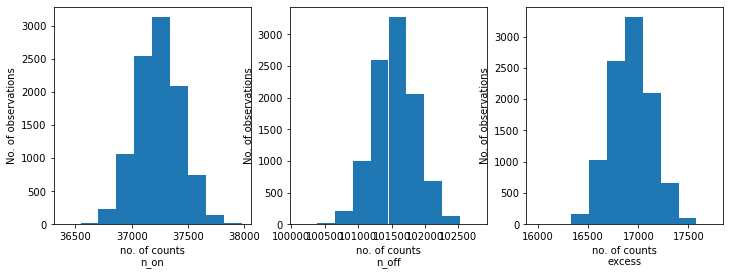

In [13]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [14]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
        }
    )

CPU times: user 10min 47s, sys: 1.44 s, total: 10min 49s
Wall time: 10min 49s


In [15]:
results

[{'index': 2.210312649457622, 'amplitude': 1.2999148010805192e-12},
 {'index': 2.221794649297089, 'amplitude': 1.2624720633438962e-12},
 {'index': 2.226917472297916, 'amplitude': 1.2692828741968535e-12},
 {'index': 2.2243294724809273, 'amplitude': 1.2760460667160836e-12},
 {'index': 2.230487848445283, 'amplitude': 1.289071814190189e-12},
 {'index': 2.2176425247166542, 'amplitude': 1.2822089037710306e-12},
 {'index': 2.216192794914367, 'amplitude': 1.2905649230744224e-12},
 {'index': 2.2181788794836295, 'amplitude': 1.2844505300569238e-12},
 {'index': 2.2148364595219476, 'amplitude': 1.2941866637630027e-12},
 {'index': 2.2099732084774226, 'amplitude': 1.3004987871954154e-12},
 {'index': 2.2172085439732427, 'amplitude': 1.3021990683930246e-12},
 {'index': 2.2163893701043262, 'amplitude': 1.3029965681849181e-12},
 {'index': 2.2152326224488714, 'amplitude': 1.3060639898614054e-12},
 {'index': 2.218580088362964, 'amplitude': 1.2638387722092008e-12},
 {'index': 2.216428727442129, 'amplitude'

index: 2.220040964916033 += 0.006578357951068767


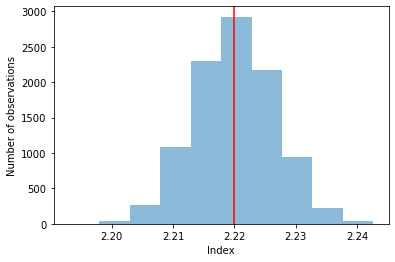

In [16]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.2891580967856507e-12 += 1.4179539562843356e-14


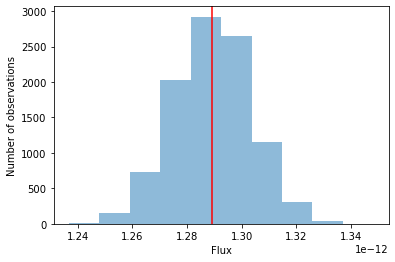

In [17]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")